# Cycle GAN for Style Transfer with horse2zebra or fcBarcelona2fcRealMadrid dataset
Author: Nuria Treviño




---

In [0]:
%load_ext autoreload
%matplotlib inline
%autoreload 2

import os
import torch
import itertools
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets, utils
from torch.utils.data import Dataset, DataLoader
from IPython.display import display
from PIL import Image
import numpy as np
import math

# Dataset

Download and prepare dataset. The exercise will be done with the horse and zebra or Barça and Madrid images

In [0]:
#dataset = 'horse2zebra'
dataset = 'fcBarcelona2fcRealMadrid'

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [4]:
# Define GDrive dataset path
PATH_OF_DATA = '/content/gdrive/"My Drive"/fcBarcelona2fcRealMadrid/fcBarcelona2fcRealMadrid.zip'
!ls {PATH_OF_DATA}

'/content/gdrive/My Drive/fcBarcelona2fcRealMadrid/fcBarcelona2fcRealMadrid.zip'


In [5]:
!mkdir -p ./datasets

if dataset == 'horse2zebra':
  # Download horse2zebra
  !wget -N https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/horse2zebra.zip -O ./datasets/horse2zebra.zip

  # Unzip dataset
  !unzip ./datasets/horse2zebra.zip -d ./datasets/
else:
  if dataset == 'fcBarcelona2fcRealMadrid':
      # Copy dataset from GDrive
      !cp {PATH_OF_DATA}  ./datasets/fcBarcelona2fcRealMadrid.zip

      # Unzip dataset
      !unzip ./datasets/fcBarcelona2fcRealMadrid.zip -d ./datasets/
      !mv ./datasets/fcBarcelona2fcRealMadrid_new ./datasets/fcBarcelona2fcRealMadrid
      !ls ./datasets/


Archive:  ./datasets/fcBarcelona2fcRealMadrid.zip
   creating: ./datasets/fcBarcelona2fcRealMadrid_new/
   creating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/601_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/602_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/603_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/604_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/605_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/606_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/607_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/608_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/609_fcBarcelona.jpg  
  inflating: ./datasets/fcBarcelona2fcRealMadrid_new/TestA/610_fcBarcelona.jpg  
  inflating: ./datasets/fc

## Utils
Some utils:

In [0]:
def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find('BatchNorm') != -1:
        m.weight.data.normal_(0.00, 0.02)
  
def display_batch_images(img, imtype=np.uint8, unnormalize=True, nrows=None, mean=0.5, std=0.5):
    # select a sample or create grid if img is a batch
    if len(img.shape) == 4:
        nrows = nrows if nrows is not None else int(math.sqrt(img.size(0)))
        img = utils.make_grid(img, nrow=nrows)

    # unnormalize
    img = img.cpu().float()
    img = (img*std+mean)*255

    # to numpy
    image_numpy = img.numpy()
    image_numpy = np.transpose(image_numpy, (1, 2, 0))
    display(Image.fromarray(image_numpy.astype(imtype)))

Class to prepare the dataset:

In [0]:
class TwoDatasets(Dataset):
  """
  Dataset class to get samples from two different image collections
  """
  def __init__(self, root_dirA, root_dirB, batch_size, transform= None):
    
    print(root_dirA, root_dirB)

    self.root_dirA = root_dirA
    self.root_dirB = root_dirB

    print(self.root_dirA, self.root_dirB)
    self.filelistA = os.listdir(self.root_dirA)
    self.filelistB = os.listdir(self.root_dirB)
    self.transform=transform
    self.batch_size = batch_size

  def __len__(self):
    if len(self.filelistA) < len(self.filelistB):
      num_img = int(len(self.filelistA)/self.batch_size) * self.batch_size
    else:
      num_img = int(len(self.filelistB)/self.batch_size) * self.batch_size
    return num_img

  #def __len__(self):
  #  return min(len(self.filelistA),len(self.filelistB))

  def __getitem__(self,idx):
    if torch.is_tensor(idx):
      idx = idx.tolist()

    img_nameA = os.path.join(self.root_dirA, self.filelistA[idx])
    img_nameB = os.path.join(self.root_dirB, self.filelistB[idx])

    imageA = Image.open(img_nameA).convert('RGB')
    imageB = Image.open(img_nameB).convert('RGB')

    if self.transform:
      imageA = self.transform(imageA)
      imageB = self.transform(imageB)

    return imageA, imageB

# Dataloader

./datasets/fcBarcelona2fcRealMadrid/TrainA ./datasets/fcBarcelona2fcRealMadrid/TrainB
./datasets/fcBarcelona2fcRealMadrid/TrainA ./datasets/fcBarcelona2fcRealMadrid/TrainB
./datasets/fcBarcelona2fcRealMadrid/TestA ./datasets/fcBarcelona2fcRealMadrid/TestB
./datasets/fcBarcelona2fcRealMadrid/TestA ./datasets/fcBarcelona2fcRealMadrid/TestB
594
198


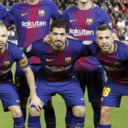

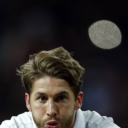

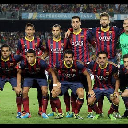

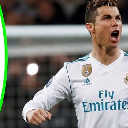

In [8]:
# Dataset loader
image_size = 128
batch_size = 9 

# Data augmentation
tf_train = transforms.Compose(
    [transforms.RandomHorizontalFlip(),
     transforms.RandomResizedCrop(image_size),
     #transforms.CenterCrop(image_size),
     transforms.ToTensor(),
     transforms.Normalize((0.5,), (0.5,))]
    )

tf_test = transforms.Compose(
    [transforms.Resize(160, interpolation=0),
     transforms.CenterCrop(image_size),
     transforms.ToTensor(),
     transforms.Normalize((0.5,), (0.5,))]
    )

if dataset == 'horse2zebra':
  horse2zebra_train = TwoDatasets('./datasets/horse2zebra/trainA','./datasets/horse2zebra/trainB', batch_size, transform=tf_train)
  horse2zebra_test  = TwoDatasets('./datasets/horse2zebra/testA','./datasets/horse2zebra/testB', batch_size, transform=tf_test)

  data_loader_train = torch.utils.data.DataLoader(horse2zebra_train, batch_size=batch_size, shuffle=True)
  data_loader_test = torch.utils.data.DataLoader(horse2zebra_test, batch_size=batch_size, shuffle=False)

  print(len(horse2zebra_train))
  print(len(horse2zebra_test))

  display_batch_images(horse2zebra_train[0][0])
  display_batch_images(horse2zebra_train[0][1])
  #
  display_batch_images(horse2zebra_test[0][0])
  display_batch_images(horse2zebra_test[0][1])
else: 
  if dataset == 'fcBarcelona2fcRealMadrid':
    fcBarcelona2fcRealMadrid_train = TwoDatasets('./datasets/fcBarcelona2fcRealMadrid/TrainA','./datasets/fcBarcelona2fcRealMadrid/TrainB', batch_size, transform=tf_train)
    fcBarcelona2fcRealMadrid_test  = TwoDatasets('./datasets/fcBarcelona2fcRealMadrid/TestA','./datasets/fcBarcelona2fcRealMadrid/TestB', batch_size, transform=tf_test)

    data_loader_train = torch.utils.data.DataLoader(fcBarcelona2fcRealMadrid_train, batch_size=batch_size, shuffle=True)
    data_loader_test = torch.utils.data.DataLoader(fcBarcelona2fcRealMadrid_test, batch_size=batch_size, shuffle=False)

    print(len(fcBarcelona2fcRealMadrid_train))
    print(len(fcBarcelona2fcRealMadrid_test))

    display_batch_images(fcBarcelona2fcRealMadrid_train[0][0])
    display_batch_images(fcBarcelona2fcRealMadrid_train[0][1])
    #
    display_batch_images(fcBarcelona2fcRealMadrid_test[0][0])
    display_batch_images(fcBarcelona2fcRealMadrid_test[0][1])

## Networks


Cycle GAN Generator

In [0]:
class Generator(torch.nn.Module):
    
    def __init__(self):
        super(Generator, self).__init__()

        # Encoder
        self._encoder1 = self.encoder(3, 64, 4)
        self._encoder2 = self.encoder(64, 128, 4)
        self._encoder3 = self.encoder(128, 256, 4)

        # Transformation Layers (RESNET)
        self._res1 = self.residual(256, 256, 3)
        self._res2 = self.residual(256, 256, 3)
        self._res3 = self.residual(256, 256, 3)
        self._res4 = self.residual(256, 256, 3)
        self._res5 = self.residual(256, 256, 3)
        self._res6 = self.residual(256, 256, 3)
        self._res7 = self.residual(256, 256, 3)
        self._res8 = self.residual(256, 256, 3)
        self._res9 = self.residual(256, 256, 3)

        # Decoder
        self._decoder1 = self.decoder(256, 128, 4)
        self._decoder2 = self.decoder(128, 64, 4)
        self._decoder3 = self.decoder2(64, 3, 4)

    def encoder(self, i, o, dim):
        x = nn.Sequential(
            nn.Conv2d(i, o, dim, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(o),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.5)
        )
        return x

    def residual(self, i, o, dim):
        x = nn.Sequential(
            nn.Conv2d(i, o, dim, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(o),
            nn.LeakyReLU(0.2),
            nn.Conv2d(i, o, dim, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(o),
            nn.LeakyReLU(0.2)
        )
        return x

    def decoder(self, i, o, dim):
        x = nn.Sequential(
            nn.ConvTranspose2d(i, o, dim, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(o),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.5)
        )
        return x

    def decoder2(self, i, o, dim): #Same as previous without normalization and changing Relu by Tanh
        x = nn.Sequential(
            nn.ConvTranspose2d(i, o, dim, stride=2, padding=1, bias=False),
            nn.Tanh()
        )
        return x 

    def forward(self, x):
        
        # Encoding
        x = self._encoder1(x)
        x = self._encoder2(x)
        x = self._encoder3(x)

        # Transformation
        x1 = self._res1(x)
        x2 = x + x1
        x3 = self._res2(x2)
        x4 = x2 + x3
        x5 = self._res3(x4)
        x6 = x4 + x5
        x7 = self._res4(x6)
        x8 = x6 + x7
        x9 = self._res5(x8)
        x10 = x8 + x9
        x11 = self._res6(x10)
        x12 = x10 + x11
        x13 = self._res7(x12)
        x = x12 + x13
        #x15 = self._res8(x14)
        #x16 = x14 + x15
        #x17 = self._res9(x16)
        #x = x16 + x17

        # Decoding
        x = self._decoder1(x)
        x = self._decoder2(x)
        x = self._decoder3(x)

        return x

Cycle GAN discriminator

In [0]:
class Discriminator(torch.nn.Module):
    
    def __init__(self):
        super(Discriminator, self).__init__()
                
        self._conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=128, kernel_size=3, stride=2, padding=1, bias=True),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self._conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self._conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self._conv4 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=3, stride=2, padding=1, bias=True),
            nn.Sigmoid(),
            nn.AdaptiveAvgPool2d(1)
        )  

        # We use the conv4 layer instead the vector flatenn through a fc layer
        self._fc = nn.Sequential(
            nn.Linear(int(512*image_size*image_size/(8*8)), 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        
        x = self._conv1(x)
        x = self._conv2(x)
        x = self._conv3(x)
        x = self._conv4(x).squeeze()

        return x #self._fc(x.view(-1, int(512*image_size*image_size/(8*8)))) 

## Model
Now lets create the core of our task, the model. The loss function can be seen having four parts:

Discriminator must approve all the original images of the corresponding categories.
Discriminator must reject all the images which are generated by corresponding Generators to fool them.
Generators must make the discriminators approve all the generated images, so as to fool them.
The generated image must retain the property of original image, so if we generate a fake image using a generator say  GeneratorA→B  then we must be able to get back to original image using the another generator  GeneratorB→A  - it must satisfy cyclic-consistency.

The Cycle GAN loss is:


$\mathcal{L}_{GAN}(G,D_Y,X,Y)=\mathbb{E}_{y\sim p_{data}(y)}\big[logD_Y(y)\big] + \mathbb{E}_{x\sim p_{data}(x)}\big[log(1-D_Y(G(x)))\big]$

$\mathcal{L}_{cyc}(G,F)=\mathbb{E}_{x\sim p_{data}(x)}\big[||F(G(x))-x||_1\big] + \mathbb{E}_{y\sim p_{data}(y)}\big[||G(F(y))-y||_1\big]$

The full objective is:

$\mathcal{L}(G,F,D_X,D_Y)=\mathcal{L}_{GAN}(G,D_Y,X,Y) + \mathcal{L}_{GAN}(F,D_X,Y,X) + \lambda\mathcal{L}_{cyc}(G,F)$

In [0]:
class Model:
    # --------------------------
    # -- PREPARE MODEL
    # --------------------------
    
    def __init__(self, batch_size):
        self._create_networks()
        self._create_optimizer()
        self._init_criterion(batch_size)
        
    def _create_networks(self):
        # create networks
        self._generator_A2B = Generator()
        self._generator_B2A = Generator()
        self._discriminator_A = Discriminator()
        self._discriminator_B = Discriminator()
        
        # init weights
        self._generator_A2B.apply(init_weights)
        self._generator_B2A.apply(init_weights)
        self._discriminator_A.apply(init_weights)
        self._discriminator_B.apply(init_weights)
        
        # move to cuda
        self._generator_A2B.cuda()
        self._generator_B2A.cuda()
        self._discriminator_A.cuda()
        self._discriminator_B.cuda()

    def _create_optimizer(self):
        # generator optimizer
        #self._opt_g = torch.optim.Adam(itertools.chain(self._generator_A2B.parameters(), self._generator_B2A.parameters()), lr=0.0002, betas=(0.5, 0.999))
        self._opt_g = torch.optim.Adam(list(self._generator_A2B.parameters()) + list(self._generator_B2A.parameters()), lr=0.0002, betas=(0.5, 0.999))
        
        # discriminator optimizer
        self._opt_d_A = torch.optim.Adam(self._discriminator_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self._opt_d_B = torch.optim.Adam(self._discriminator_B.parameters(), lr=0.0002, betas=(0.5, 0.999))
        
    def _init_criterion(self, batch_size):
        self._criterion_GAN = nn.MSELoss()
        self._criterion_cycle = nn.L1Loss()  
        self._target_real = Variable(torch.ones(batch_size, 1)).cuda()
        self._target_fake = Variable(torch.zeros(batch_size, 1)).cuda()

    # --------------------------
    # -- Optimize Model
    # --------------------------
    #
    # Optimize Generator
    #    
    def step_optimization_generator(self, real_A, real_B, fake_A, fake_B, cycle_A, cycle_B, lambda_cyc):

        # Reset gradients
        self._opt_g.zero_grad()

        # optimize generators A2B and B2A
        # discriminators are not updated
        with torch.no_grad():
          pred_fake_A = self._discriminator_B(fake_B)
          pred_fake_B = self._discriminator_A(fake_A)

        # GAN loss
        loss_GAN_A2B = self._criterion_GAN(pred_fake_A, self._target_real)
        # Posar -1*label.fake
        loss_GAN_B2A = self._criterion_GAN(pred_fake_B, self._target_real)

        # Cycle loss
        loss_cycle_A = self._criterion_cycle(real_A, cycle_A)
        loss_cycle_B = self._criterion_cycle(real_B, cycle_B,)
        loss_cycle = loss_cycle_A + loss_cycle_B
       
        # Total loss
        loss_GAN_A2B = loss_GAN_A2B + loss_cycle*lambda_cyc
        loss_GAN_B2A = loss_GAN_B2A + loss_cycle*lambda_cyc
        loss_G = loss_GAN_A2B + loss_GAN_B2A
     
        # Update weights
        loss_G.backward()
        self._opt_g.step() 
            
        return loss_G.item(), loss_GAN_A2B.item(), loss_GAN_B2A.item(), loss_cycle.item()

    #
    # Optimize Discriminators
    #    
    def step_optimization_discriminator(self, real_A, real_B, fake_A, fake_B):

        # Reset gradients
        self._opt_d_A.zero_grad()
        self._opt_d_B.zero_grad()
        
        # Optimize discriminator A   

        # Real loss
        pred_real = self._discriminator_A(real_A)
        loss_D_real = self._criterion_GAN(pred_real, self._target_real)

        # Fake loss
        pred_fake = self._discriminator_A(fake_B.detach())
        loss_D_fake = self._criterion_GAN(pred_fake, self._target_fake)
        
        # Total loss
        loss_D_A = (loss_D_real + loss_D_fake) / 2 
        loss_D_A.backward()
        
        # Update weights
        self._opt_d_A.step()

        # Optimize discriminator B
        #for params in self._discriminator_B.parameters():
        #  params.requires_grad = True

        # Real loss
        pred_real = self._discriminator_B(real_B)
        loss_D_real = self._criterion_GAN(pred_real, self._target_real)

        # Fake loss
        pred_fake = self._discriminator_A(fake_B.detach())
        loss_D_fake = self._criterion_GAN(pred_fake, self._target_fake)
        
        # Total loss
        loss_D_B = (loss_D_real + loss_D_fake) / 2 
        loss_D_B.backward()

        # Update weights
        self._opt_d_B.step

        return loss_D_A.item(), loss_D_B.item()


## Train

In [0]:
num_epochs = 200
lambda_cyc = 5
size = 256
loss_G = 1 
loss_D = 1 
n_g = 0
n_d = 0
model = Model(batch_size)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:431: UserWarning: Using a target size (torch.Size([9, 1])) that is different to the input size (torch.Size([9])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


epoch: 1/200, batch: 0/66, G_loss: 10.46125602722168, GA2B_loss: 5.231041431427002, GB2A_loss: 5.230214595794678
D_A_loss: 0.249679833650589, D_B_loss: 0.24803929030895233, CYCLE_loss: 0.996076226234436
n_g: 1, n_d:1


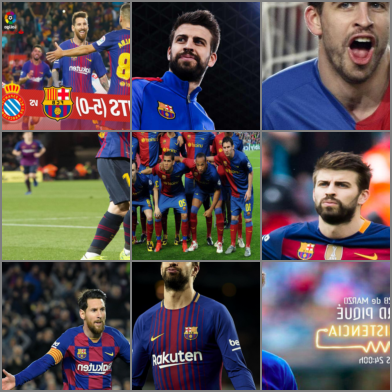

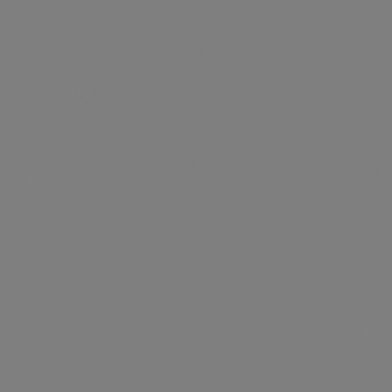

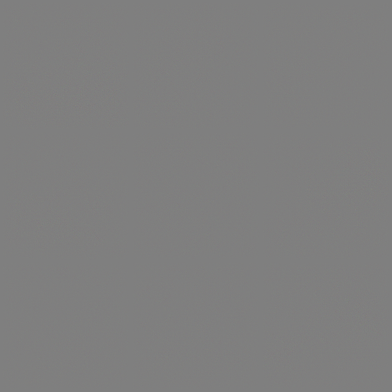

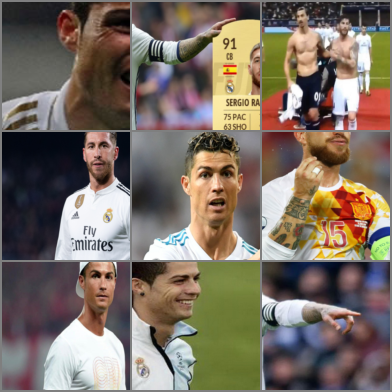

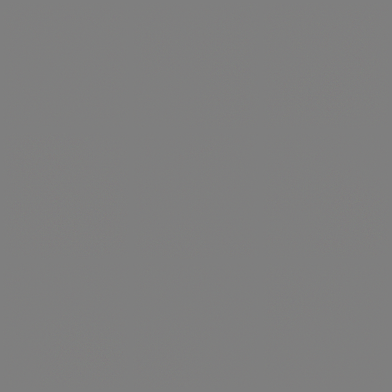

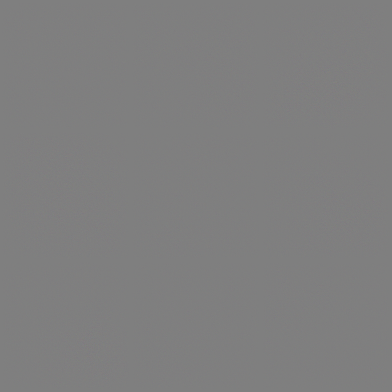

epoch: 1/200, batch: 50/66, G_loss: 9.9208402633667, GA2B_loss: 4.90988302230835, GB2A_loss: 5.01095724105835
D_A_loss: 0.15847738087177277, D_B_loss: 0.20636093616485596, CYCLE_loss: 0.931932270526886
n_g: 51, n_d:51


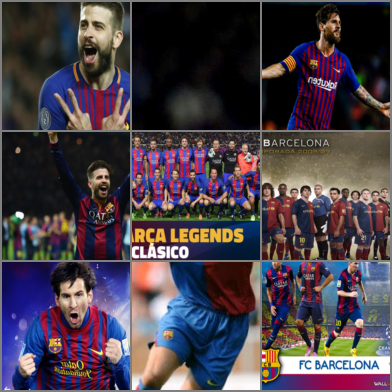

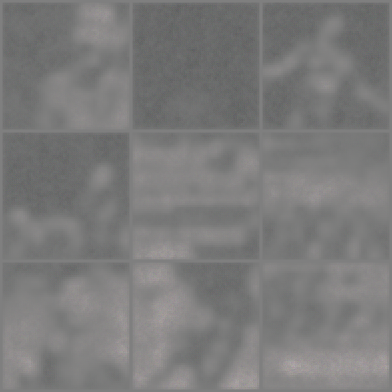

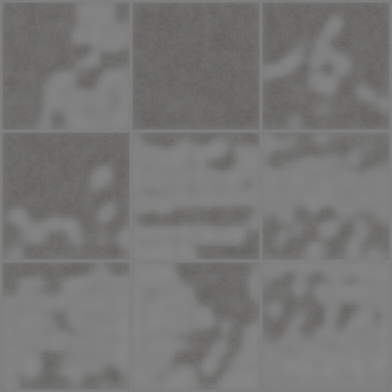

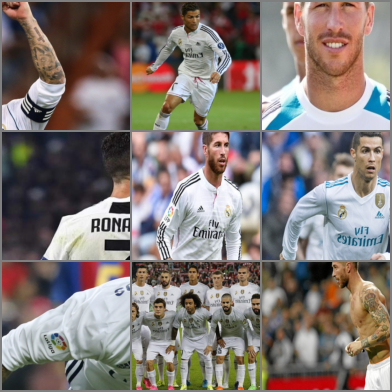

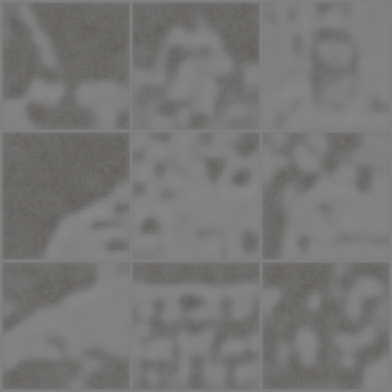

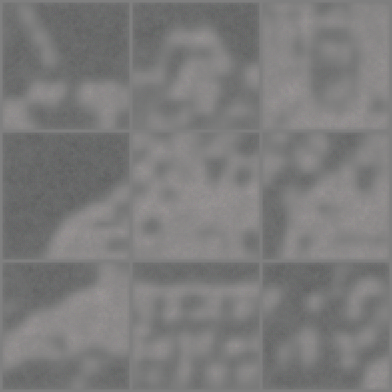

epoch: 6/200, batch: 0/66, G_loss: 5.530899524688721, GA2B_loss: 2.490196943283081, GB2A_loss: 3.0407025814056396
D_A_loss: 0.003647204488515854, D_B_loss: 0.12656383216381073, CYCLE_loss: 0.4481101632118225
n_g: 331, n_d:331


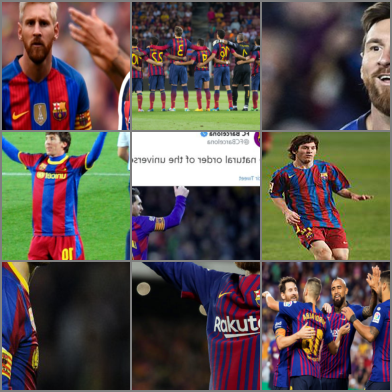

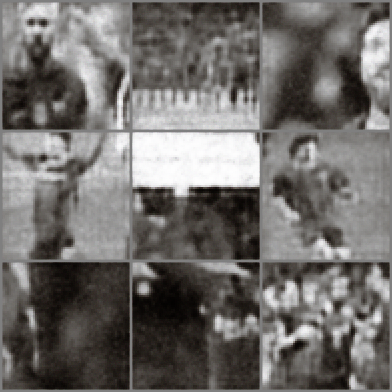

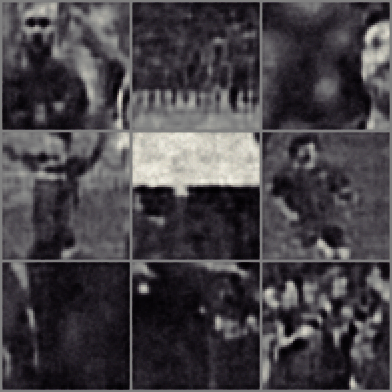

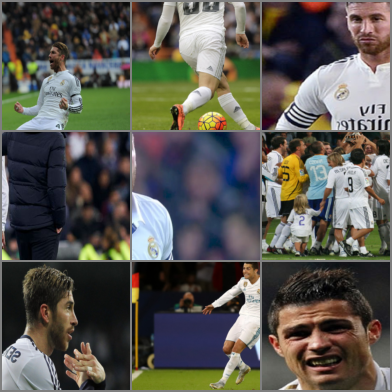

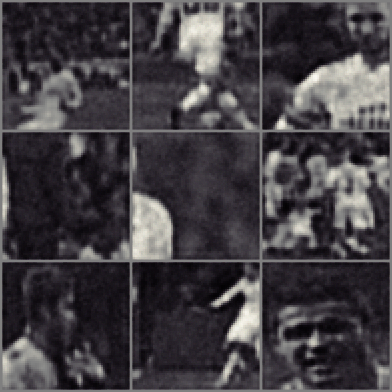

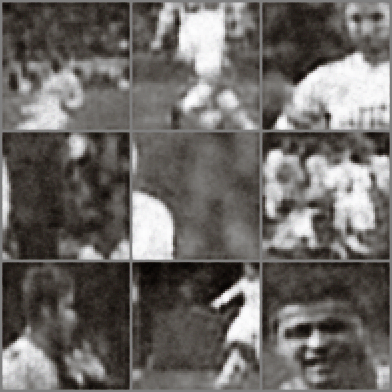

epoch: 6/200, batch: 50/66, G_loss: 4.704812526702881, GA2B_loss: 2.0847315788269043, GB2A_loss: 2.6200809478759766
D_A_loss: 0.00251707062125206, D_B_loss: 0.12608136236667633, CYCLE_loss: 0.3670336604118347
n_g: 381, n_d:381


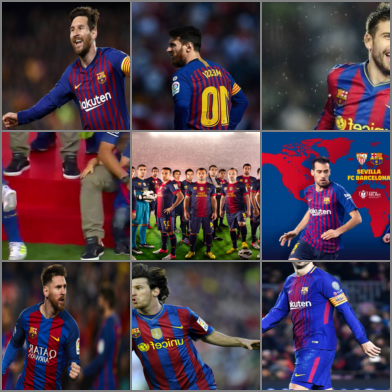

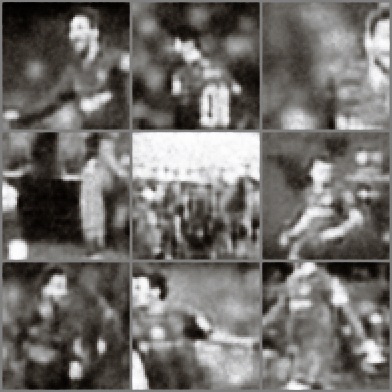

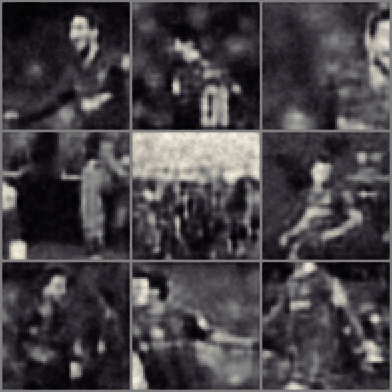

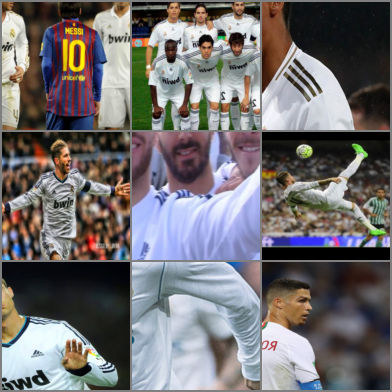

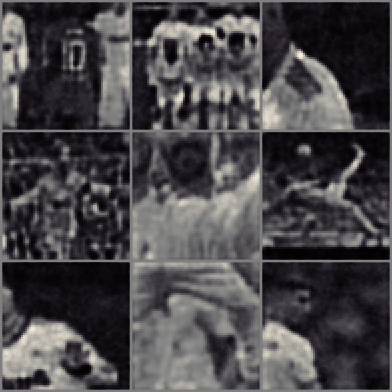

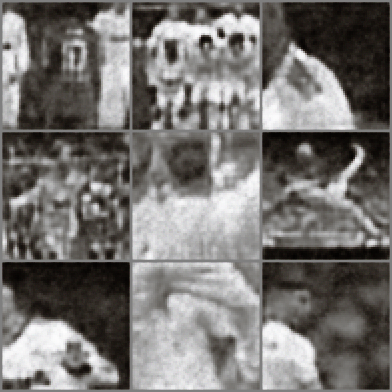

epoch: 11/200, batch: 0/66, G_loss: 4.3904314041137695, GA2B_loss: 2.023451089859009, GB2A_loss: 2.36698055267334
D_A_loss: 0.0007469429401680827, D_B_loss: 0.12510207295417786, CYCLE_loss: 0.3547446131706238
n_g: 661, n_d:661


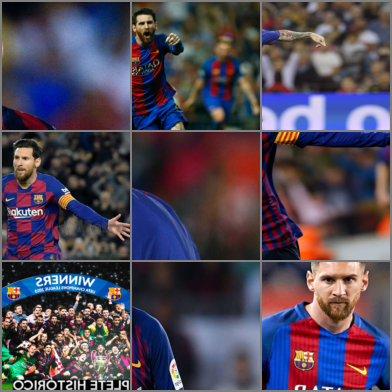

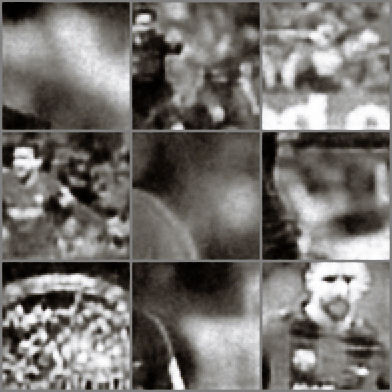

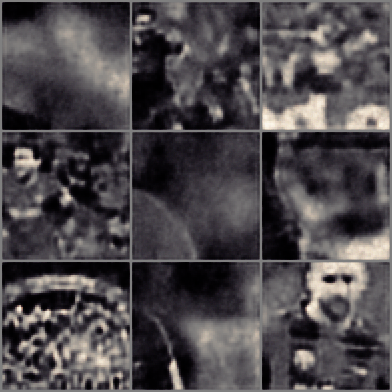

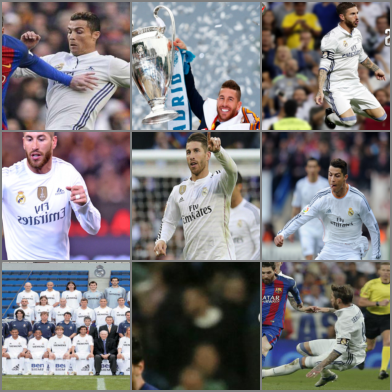

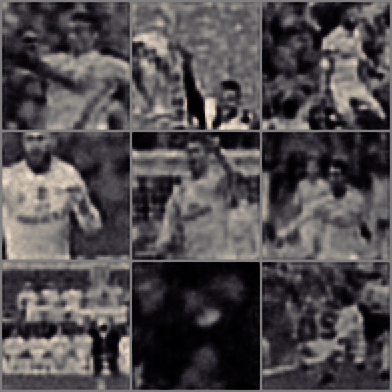

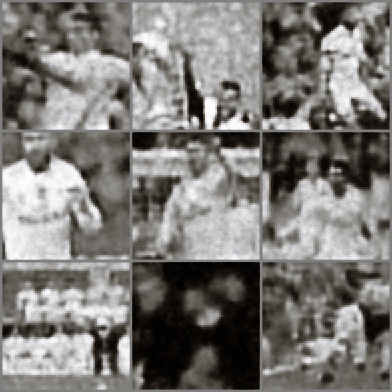

epoch: 11/200, batch: 50/66, G_loss: 4.082989692687988, GA2B_loss: 1.9742968082427979, GB2A_loss: 2.1086926460266113
D_A_loss: 0.0006192069849930704, D_B_loss: 0.12514518201351166, CYCLE_loss: 0.344917893409729
n_g: 711, n_d:711


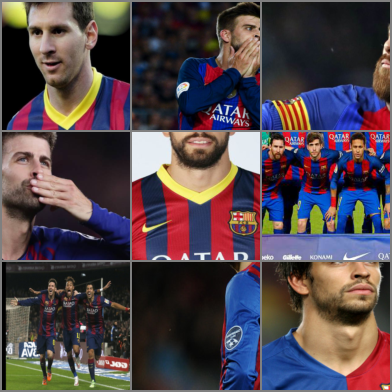

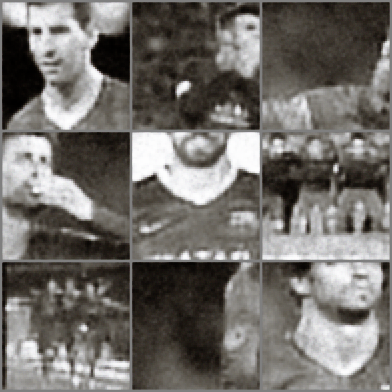

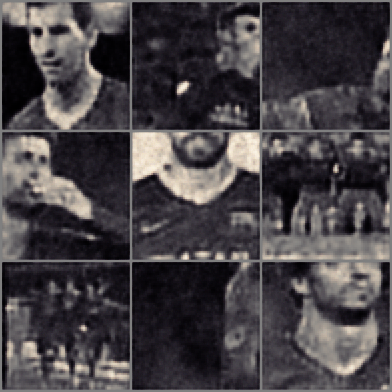

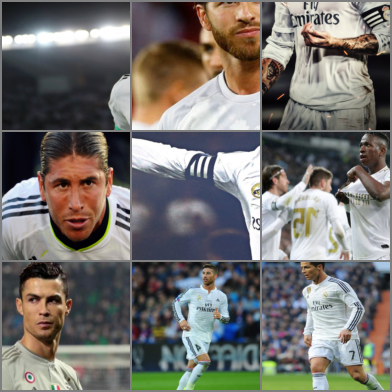

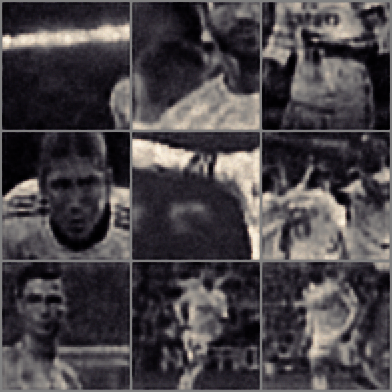

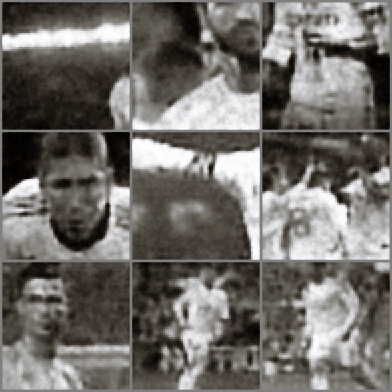

KeyboardInterrupt: ignored

In [13]:
for epoch in range(num_epochs):
  
    # Train epoch
    for n_batch, (real_A, real_B) in enumerate(data_loader_train):
        
        # Prepare batch data
        real_A = Variable(real_A).cuda()
        real_B = Variable(real_B).cuda()

        # Generate fake samples
        fake_A = model._generator_A2B(real_A)
        fake_B = model._generator_B2A(real_B)
        cycle_A = model._generator_B2A(fake_A)
        cycle_B = model._generator_A2B(fake_B)

        if (loss_G >= loss_D):
          # Optimize generators
          loss_G, loss_GAN_A2B, loss_GAN_B2A, loss_cycle = model.step_optimization_generator(real_A, real_B, fake_A, fake_B, cycle_A, cycle_B, lambda_cyc)
          n_g = n_g + 1
        
        if (loss_D >= 0.005) or (loss_D >= loss_G):
          # Optimize discriminators
          loss_D_A, loss_D_B = model.step_optimization_discriminator(real_A, real_B, fake_A, fake_B)
          loss_D = loss_D_A + loss_D_B
          n_d = n_d + 1

        # Show current loss
        if (epoch % 5 == 0) and (n_batch % 50 == 0):
            print(f"epoch: {epoch+1}/{num_epochs}, batch: {n_batch}/{len(data_loader_train)}, G_loss: {loss_G}, GA2B_loss: {loss_GAN_A2B}, GB2A_loss: {loss_GAN_B2A}")
            print(f"D_A_loss: {loss_D_A}, D_B_loss: {loss_D_B}, CYCLE_loss: {loss_cycle}")    
            print(f"n_g: {n_g}, n_d:{n_d}")
                   
        # Show fake samples
        if (epoch % 5 == 0) and (n_batch % 50 == 0): #n_batch == 100:
            fake_A = model._generator_A2B(real_A)
            fake_B = model._generator_B2A(fake_A)
            display_batch_images(real_A)
            display_batch_images(fake_A.detach())
            display_batch_images(fake_B.detach())

            fake_B = model._generator_B2A(real_B)
            fake_A = model._generator_A2B(fake_B)
            display_batch_images(real_B)
            display_batch_images(fake_B.detach())
            display_batch_images(fake_A.detach())


In [0]:
# Test example
idx = 50
fake_A = model._generator_A2B(fcBarcelona2fcRealMadrid_test[idx][0].unsqueeze(0).cuda())
fake_B = model._generator_B2A(fake_A)
display_batch_images(fcBarcelona2fcRealMadrid_test[idx][0])
display_batch_images(fake_A.detach())
display_batch_images(fake_B.detach())
#
idx = 100
fake_B = model._generator_B2A(fcBarcelona2fcRealMadrid_test[idx][1].unsqueeze(0).cuda())
fake_A = model._generator_A2B(fake_B)
display_batch_images(fcBarcelona2fcRealMadrid_test[idx][1])
display_batch_images(fake_B.detach())
display_batch_images(fake_A.detach())